callback 

цель <- заданная точность, разные шаги

оценка ошибки

# Математический маятник

Математический маятник - классический пример гармонического осциллятора.

Пусть он состоит из материальной точки массой $m$, подвешенной на конце невесомой нерастяжимой нити или лёгкого стержня длины $L$, как показано на рис. 

![Pendulum](https://github.com/GandhiKK/Pendulum-2021/raw/master/project/pendulum.png)

Маятник движется только в одной плоскости, и трение отсутствует. Пусть $\theta$ обозначает угол между вертикальной осью и нитью, такой, что $\theta = 0$ означает положение равновесия. Предполагается, что потерь энергии в системе нет.

Воспользуемся вторым законом Ньютона $F = ma$, чтобы найти дифференциальное уравнение, описывающее движение маятника. Пусть $t$ обозначает время. 

Движение маятника описывается уравнением:

$$ L\ddot{\theta}=L\dfrac{d^2\theta}{dt^2}=-g\sin(\theta) $$

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('bmh')
figsize = (12, 5)
dpi = 600

### Аналитическое решение

Уравнение не может быть решено аналитически. Однако в области малых углов $sin(\theta)\approx\theta$ это уравнение может быть аппроксимировано как 
$$ L\ddot{\theta}\approx-g\theta $$
которое имеет решение:
$$\theta=\theta_0\cos(\omega t)$$
где $\theta_0$ - начальная позиция при $t=0$, а $\omega=\sqrt{g/L}$ - собственная частота колебаний

Это называется грамоническими колебаниями. Период колебаний равен $T=2\pi/\omega=2\pi\sqrt{L/g}$

In [ ]:
g = 9.81
L = 50
theta0 = np.pi/12
t0 = 0
T = 500

In [ ]:
def approx(t, theta0):
    return theta0*np.cos(np.sqrt(g/L)*t)

#### График аналитического решения уравнения с шагом $h = 0.001$:

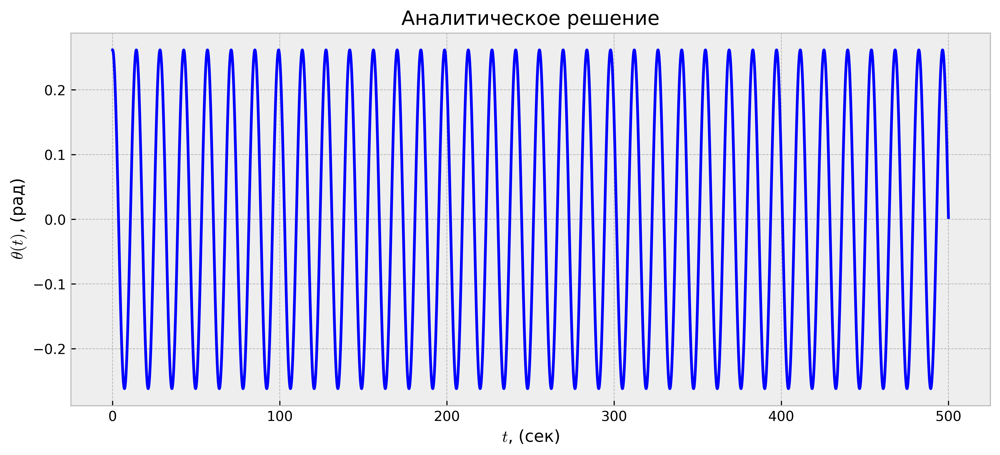

In [ ]:
t = np.arange(t0, T, 0.001)
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Аналитическое решение")
plt.plot(t, approx(t, theta0), "b-")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.show()

### Численное решение

Запишем исходное дифференциальное уравнение в виде двух связанных дифференциальных уравнений первого порядка, введя угловую скорость $\omega=\dot\theta$:
$$d\theta = \omega\,dt$$
$$d\omega = -\dfrac{g}{L}\theta\,dt$$


In [ ]:
def f(X):
    theta = X[0]
    w = X[1]
    dtheta = w
    dw = -(g/L)*(theta)
    return np.array([dtheta, dw])

## Явные одношаговые методы

### Метод Эйлера (1)

Явный одношаговый метод семейства Рунге-Кутты первого порядка.

Имеет погрешность на шаге $o(h^2)$ и погрешность в целом $o(h)$.

Таблица Бутчера для метода:

<!-- \begin{array}
{c|cccc}
0\\
\frac{1}{2} & \frac{1}{2}\\
\frac{1}{2} &0 &\frac{1}{2} \\
1& 0& 0& 1\\
\hline
& \frac{1}{6} &\frac{1}{3} &\frac{1}{3} &\frac{1}{6} 
\end{array} -->

\begin{array}
{|cc}
1 \\
\hline
0 
\end{array}

In [ ]:
def euler_method(f, X0, t0, T, h):
    t = np.arange(t0, T, h)
    n = len(t)
    X  = np.zeros([n, 2])
    X[0] = X0
    for i in range(n-1):
        k1 = f(X[i])
        X[i + 1] = X[i] + h*k1    
    return X

In [ ]:
h1 = 0.001
X = euler_method(f, [theta0, 0], t0, T, h1)
theta1, w1 = X[:, 0], X[:, 1]
h2 = 0.01
X = euler_method(f, [theta0, 0], t0, T, h2)
theta2, w2 = X[:, 0], X[:, 1]

#### График аналитического решения уравнения и решения методом Эйлера  с шагом $h_1 = 0.001$ и $h_2 = 0.01$:

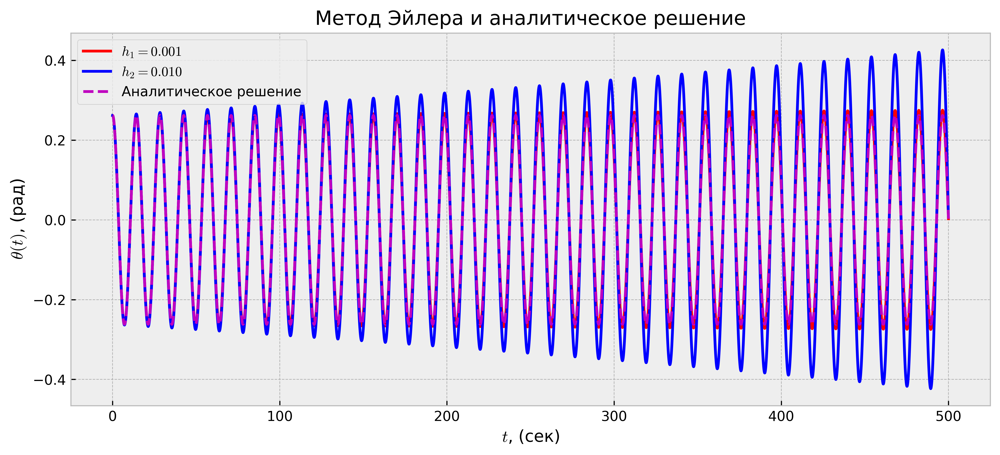

In [ ]:
t1 = np.arange(t0, T, h1)
t2 = np.arange(t0, T, h2)
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод Эйлера и аналитическое решение")
plt.plot(t1, theta1, "r-", label=r"$h_1=%.3f$"%(h1))
plt.plot(t2, theta2, "b-", label=r"$h_2=%.3f$"%(h2))
plt.plot(t, approx(t, theta0), "m--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

#### График модуля ошибки аналитического решения уравнения и решения методом Эйлера  с шагом $h = 0.00001$:

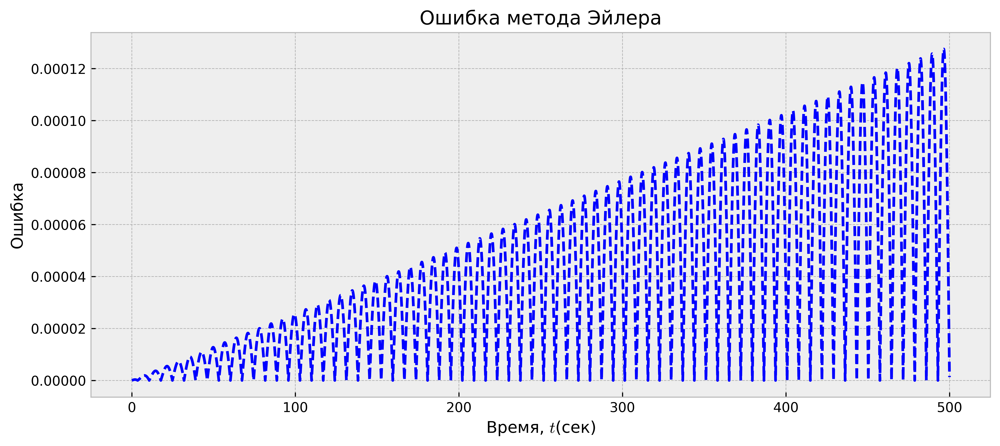

Максимальная ошибка равна  0.00012753996918407617


In [ ]:
he = 0.00001
te = np.arange(t0, T, he)
X = euler_method(f, [theta0, 0], t0, T, he)
error = np.abs(approx(te, theta0) - X[:, 0])
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(te, error, "b--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Эйлера") 
plt.show()
print("Максимальная ошибка равна ", np.max(error))

### Метод средней точки (2)

Явный одношаговый метод семейства Рунге-Кутты второго порядка. 

Имеет погрешность на шаге $o(h^3)$ и погрешность в целом $o(h^2)$.

Таблица Бутчера для метода:

\begin{array}
{|cc}
0 \\
1/2 & 0 \\
\hline
0 & 1
\end{array}

In [ ]:
def midpoint_method(f, X0, t0, T, h):
    t = np.arange(t0, T, h)
    n = len(t)
    X  = np.zeros([n, 2])
    X[0] = X0
    for i in range(n-1):
        k1 = f(X[i])
        k2 = f(X[i] + h/2*k1)
        X[i+1] = X[i] + h*k2
    return X

In [ ]:
h1 = 0.01
X= midpoint_method(f, [theta0, 0], t0, T, h1)
theta1, w1 = X[:, 0], X[:, 1]
h2 = 0.001
X= midpoint_method(f, [theta0, 0], t0, T, h2)
theta2, w2 = X[:, 0], X[:, 1]

#### График аналитического решения уравнения и решения методом средней точки с шагом $h_1 = 0.01$ и $h_2 = 0.001$:

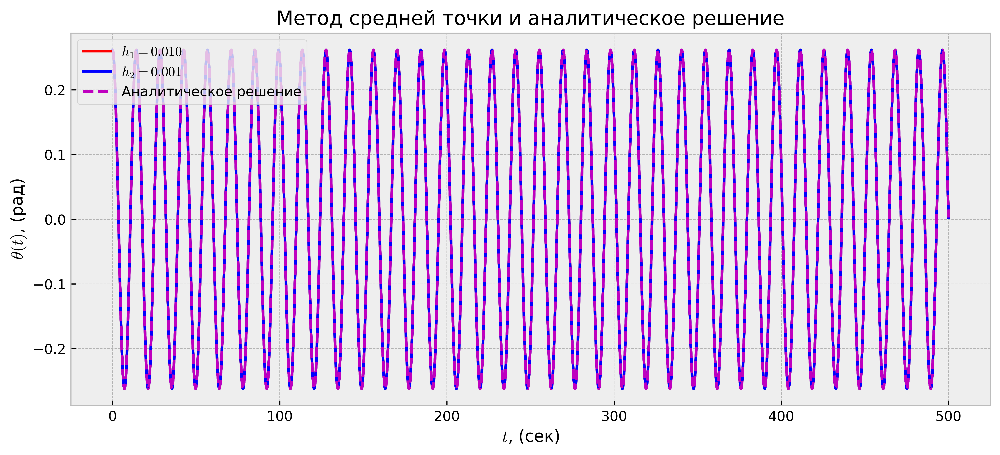

In [ ]:
t1 = np.arange(t0, T, h1)
t2 = np.arange(t0, T, h2)
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод средней точки и аналитическое решение")
plt.plot(t1, theta1, "r-", label=r"$h_1=%.3f$"%(h1))
plt.plot(t2, theta2, "b-", label=r"$h_2=%.3f$"%(h2))
plt.plot(t, approx(t, theta0), "m--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

#### График модуля ошибки аналитического решения уравнения и решения методом средней точки с шагом $h = 0.0001$:

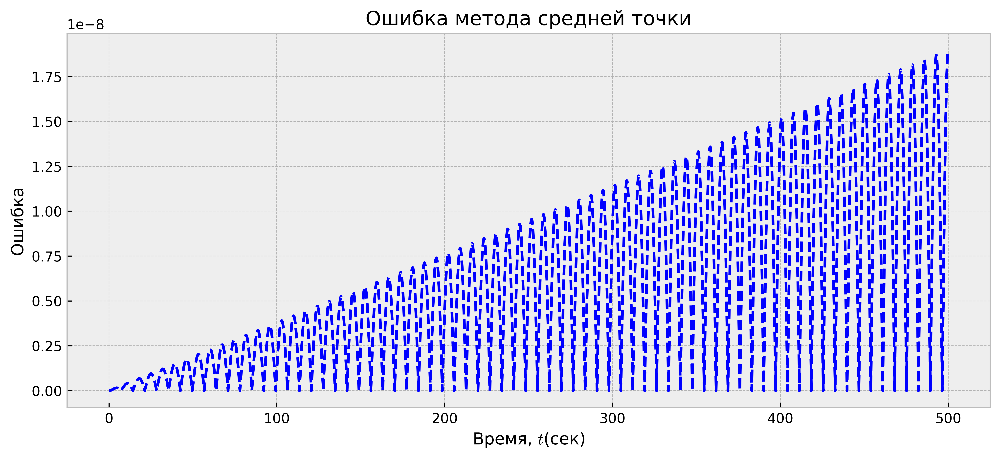

Максимальная ошибка равна  1.8958931982063915e-08


In [ ]:
he = 0.0001
te = np.arange(t0, T, he)
X = midpoint_method(f, [theta0, 0], t0, T, he)
error = np.abs(approx(te, theta0) - X[:, 0])
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(te, error, "b--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода средней точки") 
plt.show()
print("Максимальная ошибка равна ", np.max(error))

### Метод Рунге-Кутты (4)

Явный одношаговый метод семейства Рунге-Кутты четвёртого порядка. 
Имеет погрешность на шаге $o(h^5)$ и погрешность в целом $o(h^4)$.

Таблица Бутчера для метода:

\begin{array}
{|cccc}
0 \\
1/2 & 0 \\
0 & 1/2 & 0 \\
0 & 0 & 1 & 0 \\
\hline
1/6 & 1/3 & 1/3 & 1/6 
\end{array}

In [ ]:
def RK4_method(f, X0, t0, T, h):
    t = np.arange(t0, T, h)
    n = len(t)
    X  = np.zeros([n, 2])
    X[0] = X0
    for i in range(n-1):
        k1 = f(X[i])
        k2 = f(X[i] + h/2*k1)
        k3 = f(X[i] + h/2*k2)
        k4 =  f(X[i] + h*k3)
        X[i+1] = X[i] + h/6*(k1 + 2*k2 + 2*k3 + k4)
    return X

In [ ]:
h1 = 0.01
X = RK4_method(f, [theta0, 0], t0, T, h1)
theta1, w1 = X[:, 0], X[:, 1]

#### График аналитического решения уравнения и решения методом Рунге-Кутты 4  с шагом $h = 0.01$:

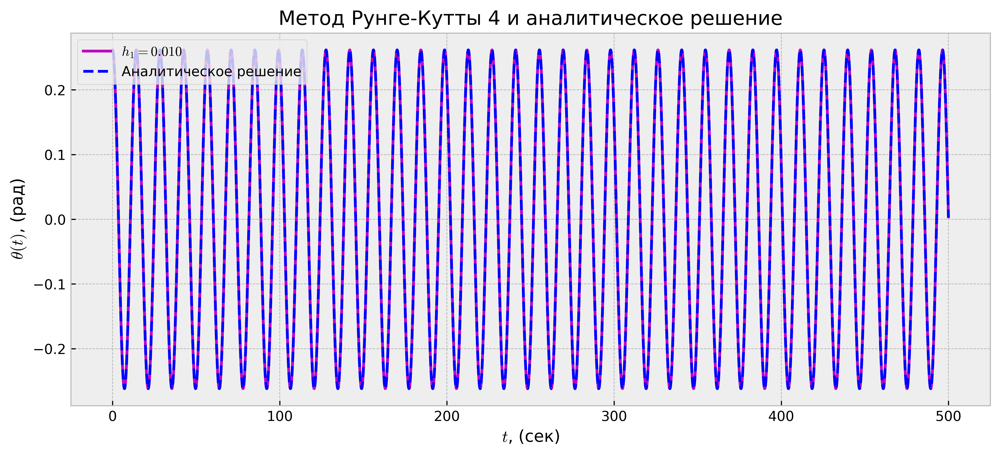

In [ ]:
t1 = np.arange(t0, T, h1)
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод Рунге-Кутты 4 и аналитическое решение")
plt.plot(t1, theta1, "m", label=r"$h_1=%.3f$"%(h1))
plt.plot(t, approx(t, theta0), "b--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

#### График модуля ошибки аналитического решения уравнения и решения методом Рунге-Кутты 4 с шагом $h = 0.01$:

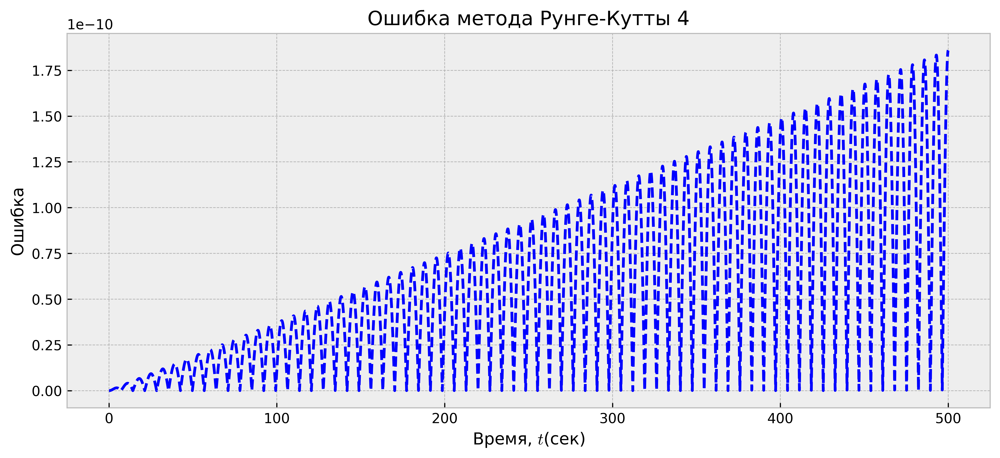

Максимальная ошибка равна  1.8595432485501995e-10


In [ ]:
he = 0.01
te = np.arange(t0, T, he)
X = RK4_method(f, [theta0, 0], t0, T, he)
error = np.abs(approx(te, theta0) - X[:, 0])
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(te, error, "b--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Рунге-Кутты 4") 
plt.show()
print("Максимальная ошибка равна ", np.max(error))

## Явные одношаговые вложенные методы


### Метод Богацкого-Шампина (3(2))

Метод Богацкого-Шампина - это метод Рунге-Кутты третьего порядка с четырьмя этапами со свойством FSAL, поэтому он использует примерно три вычисления функции на шаг.

Таблица Бутчера для метода:

\begin{array}
{|cccc}
0 \\
1/2 & 0 \\
0 & 3/4 & 0 \\
2/9 & 1/3 & 4/9 & 0 \\
\hline
2/9 & 1/3 & 4/9 & 0 \\
\hline
7/24 & 1/4 & 1/3 & 1/8 
\end{array}

In [ ]:
def error_handler(x, x_hat):
    err = 0
    x = np.array(x)
    x_hat = np.array(x_hat)
    tol = np.zeros(len(x))
    for i in range(len(x)):
        tol[i] = atol + max(abs(x[i]), abs(x_hat[i])) * rtol
        err += ((x_hat[i] - x[i]) / tol[i]) ** 2
    err = np.sqrt(err/(len(x)))
    return err

def BS_method(f, X0, t0, T, h):
    X_news = [X0]
    X_hats = [X0]
    time = [t0]
    errors = []

    while t0 < T:
        k1 = f(X0)
        k2 = f(X0 + h/2*k1)
        k3 = f(X0 + (3*h)/4*k2)
        X_new = X0 + (2*h)/9*k1 + (1*h)/3*k2 + (4*h)/9*k3 
        k4 =  f(X_new)
        X_hat = X0 + h/24*(7*k1 + 6*k2 + 8*k3 + 3*k4)
        eps = np.abs(X_new[0]-X_hat[0])
        err = error_handler(X_new, X_hat)
        h = h * ((1/err)**(1/3))
        t0 = t0 + h
        X0 = X_new
        X_news.append(X_new)
        X_hats.append(X_hat)       
        time.append(t0)
        errors.append(eps)
    errors.append(eps)
    return np.array(X_news), np.array(time), np.array(errors)

In [ ]:
atol, rtol = 2e-13, 2e-13
h = 0.01
t0 = 0
X, t1, e1 = BS_method(f, [theta0, 0], t0, T, h)

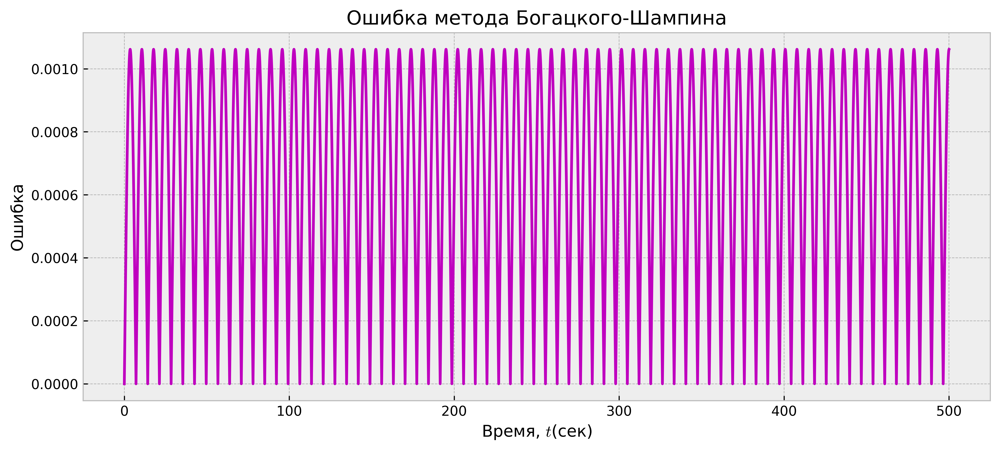

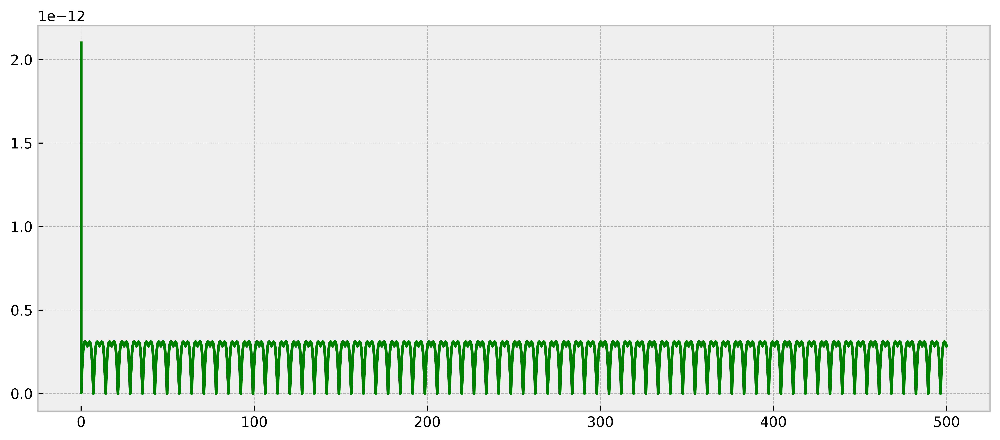

In [ ]:
plt.figure(figsize=figsize, dpi=dpi)
theta1 = approx(t1, theta0)
yy =  np.abs(X[:, 0]-theta1)
plt.plot(t1, yy, "m-")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Богацкого-Шампина") 
plt.show()
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(t1, e1, "g-")
plt.show()
# print("Максимальная ошибка равна ", np.max(error1))

## Многошаговые методы

### Метод Адамса-Башфорта

$ k = 4 : x_{n+1} = x_n + h(\dfrac{55}{24}f_n-\dfrac{59}{24}f_{n-1}+\dfrac{37}{24}f_{n-2}-\dfrac{3}{8}f_{n-3}) $

Для вычисления начальных значений был использован одношаговый метод Рунге-
Кутты 4 порядка.

In [ ]:
def AB_method(f, X0, t0, T, h):
    t = np.arange(t0, T, h)
    n = len(t)
    X = np.zeros([n, 2])    
    X[:5] = RK4_method(f, X0, t0, t0+5*h, h)
    for i in range(4, n-1):
        X[i+1] = X[i] + h/24. * (55*f(X[i]) - 59*f(X[i-1]) + 37*f(X[i-2]) - 9*f(X[i-3]))          
    return X

In [ ]:
h1 = 0.01
X = AB_method(f, [theta0, 0], t0, T, h1)
theta1, w1 = X[:, 0], X[:, 1]

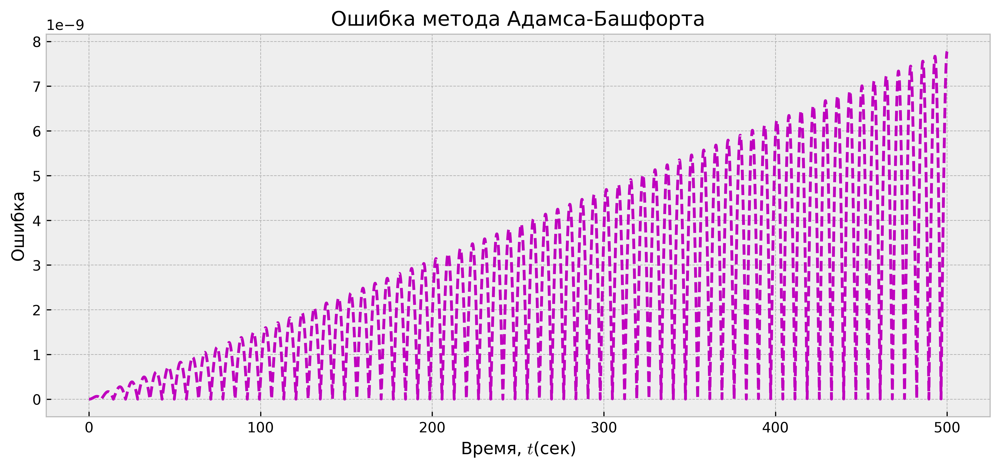

Максимальная ошибка равна  7.77831453890529e-09


In [ ]:
t1 = np.arange(t0, T, h1)
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(t1, np.abs(theta1-approx(t1, theta0)), "m--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Адамса-Башфорта") 
plt.show()
print("Максимальная ошибка равна ", np.max(np.abs(theta1-approx(t1, theta0))))

### Метод Адамса-Мултона

$x_{n+1} \leftarrow x_n + h\sum_{i=0}^{k-1}\gamma_i\triangledown^if_n - Predictor (P)$

$f_{n+1} \leftarrow f(x_{n+1}) - Evaluator (PE)$

$x_{n+1} \leftarrow x_n + h\sum_{i=0}^{k}\gamma_i^*\triangledown^if_{n+1} - Corrector (PEC)$

В качестве разгона выступает метод Рунке-Кутты 4 порядка

Схема - PECE



In [ ]:
def AM_method(f, X0, t0, T, h):
    t = np.arange(t0, T, h)
    n = len(t)
    X = np.zeros([n, 2])
    X[:4] = RK4_method(f, X0, t0, t0+4*h, h)    
    k0, k1, k2, k3 = f(X[3]), f(X[2]), f(X[1]), f(X[0])
    for i in range(3, n-1):
        k4, k3, k2, k1 = k3, k2, k1, k0 
        # Предиктор (Адамс-Башфорт)
        X[i+1] = X[i] + h/24. * (55*k1 - 59*k2 + 37*k3 - 9*k4)
        k0 = f(X[i+1])
        # Корректор (Адамс-Мултон)
        X[i+1] = X[i] + h/24. * (9*k0 + 19*k1 - 5*k2 + 1*k3)
        k0 = f(X[i+1])
    return X

In [ ]:
h1 = 0.01
X = AM_method(f, [theta0, 0], t0, T, h1)
theta1, w1 = X[:, 0], X[:, 1]

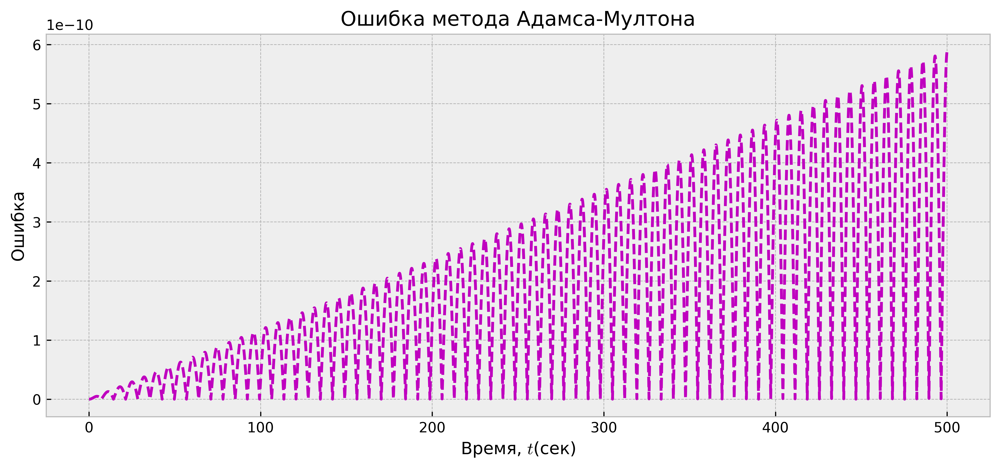

Максимальная ошибка равна  5.885266757439667e-10


In [ ]:
t1 = np.arange(t0, T, h1)
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(t1, np.abs(theta1-approx(t1, theta0)), "m--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Адамса-Мултона") 
plt.show()
print("Максимальная ошибка равна ", np.max(np.abs(theta1-approx(t1, theta0))))